In [10]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:
path = '/kaggle/input/coco-2017-dataset/coco2017/train2017'
paths = glob.glob(path + "/*.jpg") 
np.random.seed(123)
paths_subset = np.random.choice(paths, 10_000, replace=False) 
rand_idxs = np.random.permutation(10_000)
train_idxs = rand_idxs[:8000] 
val_idxs = rand_idxs[8000:] 
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


In [12]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), 
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
        
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") 
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. 
        ab = img_lab[[1, 2], ...] / 110.
        
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=8, n_workers=4, pin_memory=True, **kwargs):
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [13]:
train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

torch.Size([8, 1, 256, 256]) torch.Size([8, 2, 256, 256])
1000 250


In [14]:
from fastai.vision.learner import create_body, create_unet_model
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet

def build_res_unet(n_input=1, n_output=2, size=256):
    
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    resnet18_model = resnet18(pretrained=True)
    body = create_body(resnet18_model, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G

In [15]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [16]:
def pretrain_generator(net_G, train_dl, opt, criterion, epochs):
    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            
            loss_meter.update(loss.item(), L.size(0))
            
        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

net_G = build_res_unet(n_input=1, n_output=2, size=256)
opt = optim.Adam(net_G.parameters(), lr=1e-4)
criterion = nn.L1Loss()        
pretrain_generator(net_G, train_dl, opt, criterion, 20)
torch.save(net_G.state_dict(), "res18-unet.pt")

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/20
L1 Loss: 0.08407


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 2/20
L1 Loss: 0.08035


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 3/20
L1 Loss: 0.07920


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 4/20
L1 Loss: 0.07838


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 5/20
L1 Loss: 0.07776


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 6/20
L1 Loss: 0.07703


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 7/20
L1 Loss: 0.07632


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 8/20
L1 Loss: 0.07561


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 9/20
L1 Loss: 0.07496


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 10/20
L1 Loss: 0.07422


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 11/20
L1 Loss: 0.07339


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 12/20
L1 Loss: 0.07272


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 13/20
L1 Loss: 0.07200


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 14/20
L1 Loss: 0.07133


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 15/20
L1 Loss: 0.07062


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 16/20
L1 Loss: 0.06963


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 17/20
L1 Loss: 0.06957


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 18/20
L1 Loss: 0.06827


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 19/20
L1 Loss: 0.06773


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 20/20
L1 Loss: 0.06685


In [18]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

In [20]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] 
                                                  
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] 
                                                                                             
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): 
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [22]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [23]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [24]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [26]:
def train_model(model, train_dl, epochs, display_every=1000):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs

model = MainModel()
# train_model(model, train_dl, 50)
# torch.save(net_G.state_dict(), "GAN-unet.pt")

model initialized with norm initialization
model initialized with norm initialization


model initialized with norm initialization


  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 1/10
Iteration 1000/1000
loss_D_fake: 0.59992
loss_D_real: 0.60435
loss_D: 0.60214
loss_G_GAN: 1.08075
loss_G_L1: 8.05013
loss_G: 9.13088


/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 794 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


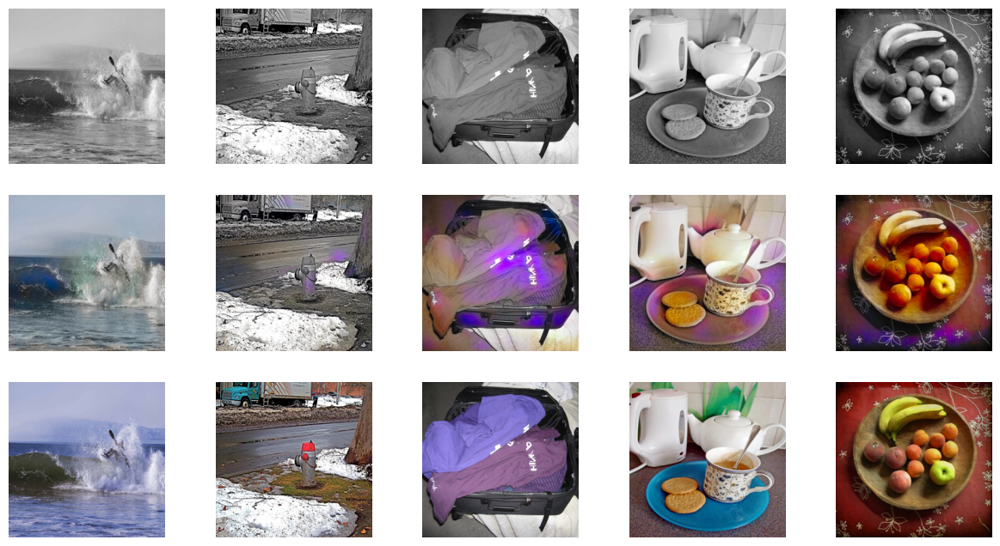

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 2/10
Iteration 1000/1000
loss_D_fake: 0.57500
loss_D_real: 0.59572
loss_D: 0.58536
loss_G_GAN: 1.11589
loss_G_L1: 8.09042
loss_G: 9.20630


/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 232 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


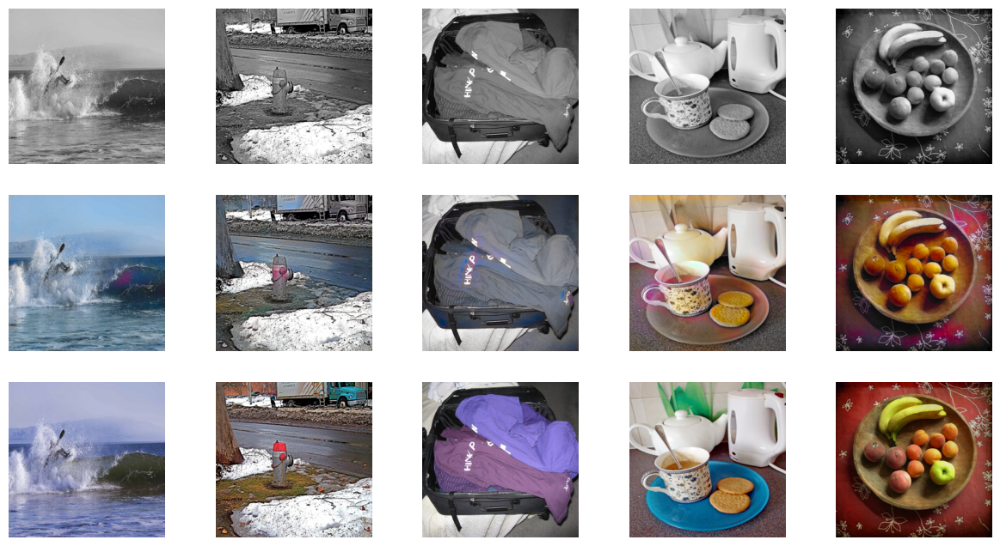

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 3/10
Iteration 1000/1000
loss_D_fake: 0.56826
loss_D_real: 0.60449
loss_D: 0.58637
loss_G_GAN: 1.10820
loss_G_L1: 8.05676
loss_G: 9.16496


/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 9 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


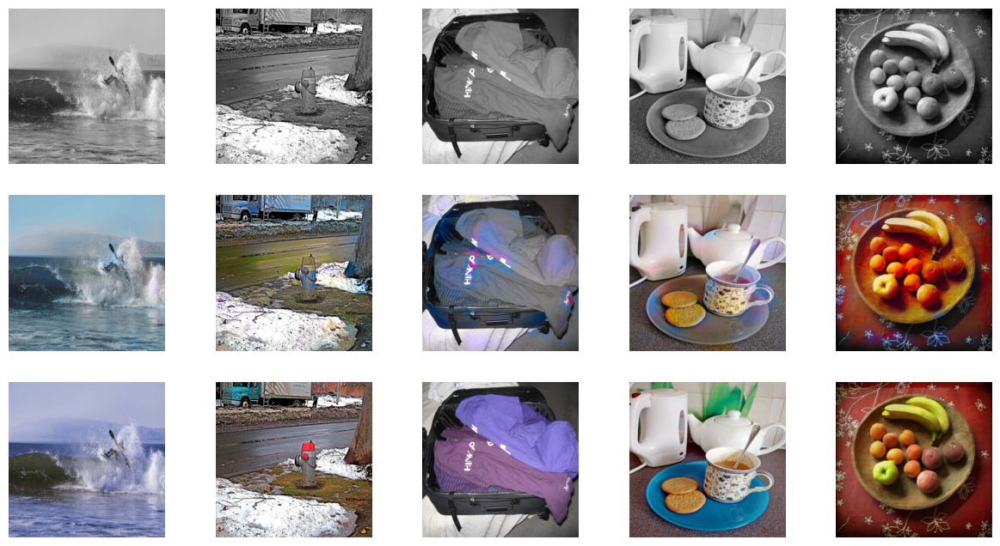

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 4/10
Iteration 1000/1000
loss_D_fake: 0.57621
loss_D_real: 0.61360
loss_D: 0.59490
loss_G_GAN: 1.08169
loss_G_L1: 8.01584
loss_G: 9.09753


/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


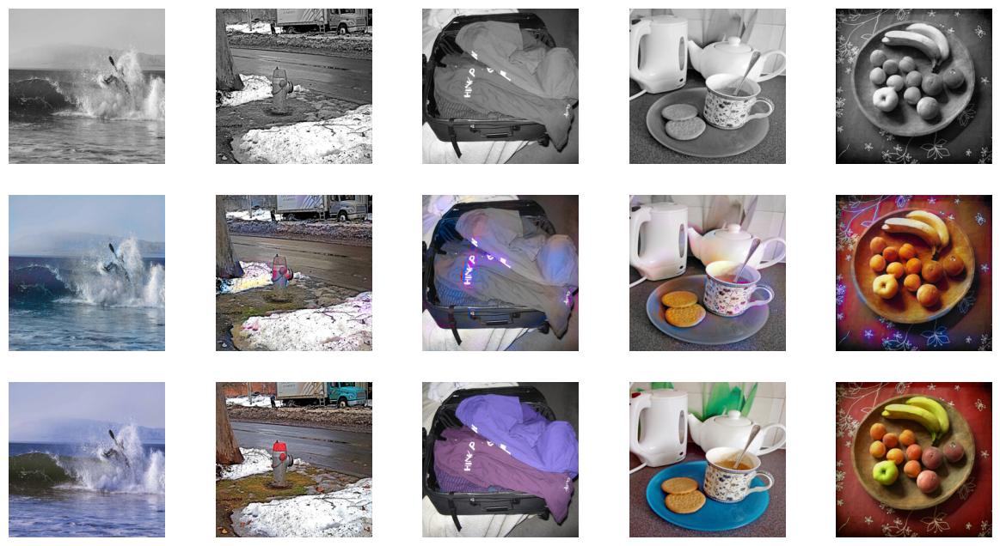

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 5/10
Iteration 1000/1000
loss_D_fake: 0.57949
loss_D_real: 0.61807
loss_D: 0.59878
loss_G_GAN: 1.06034
loss_G_L1: 7.90107
loss_G: 8.96141


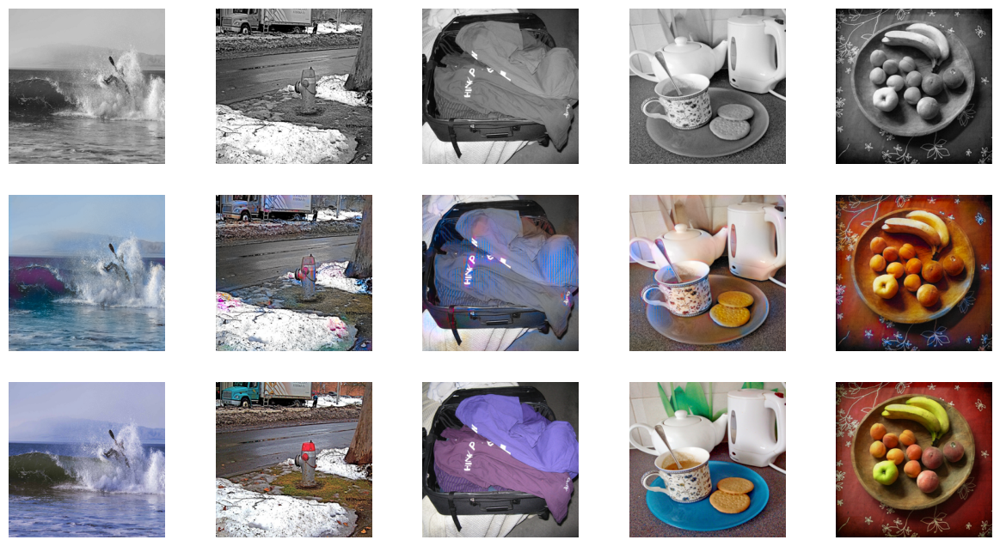

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 6/10
Iteration 1000/1000
loss_D_fake: 0.58016
loss_D_real: 0.61923
loss_D: 0.59970
loss_G_GAN: 1.04781
loss_G_L1: 7.75256
loss_G: 8.80037


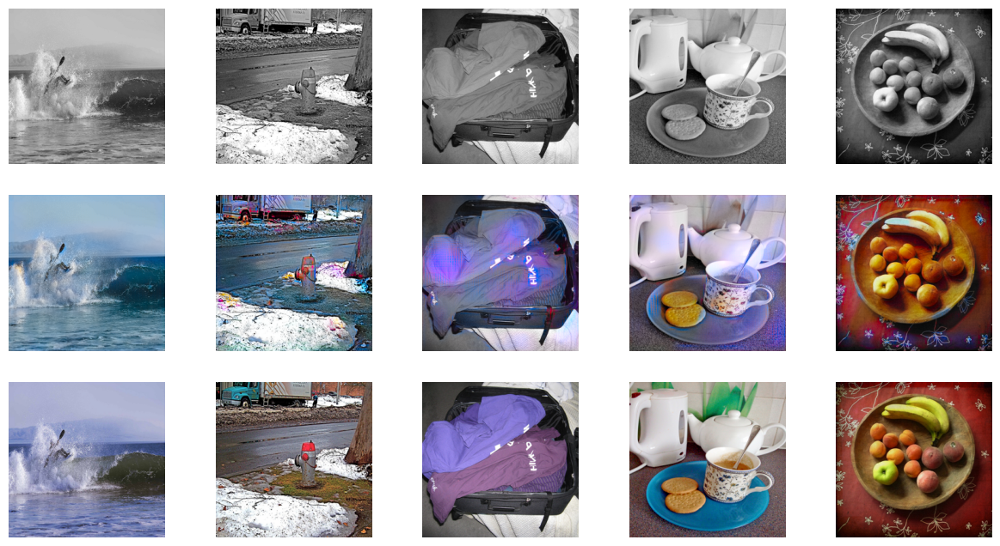

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 7/10
Iteration 1000/1000
loss_D_fake: 0.58030
loss_D_real: 0.62046
loss_D: 0.60038
loss_G_GAN: 1.04465
loss_G_L1: 7.65659
loss_G: 8.70124


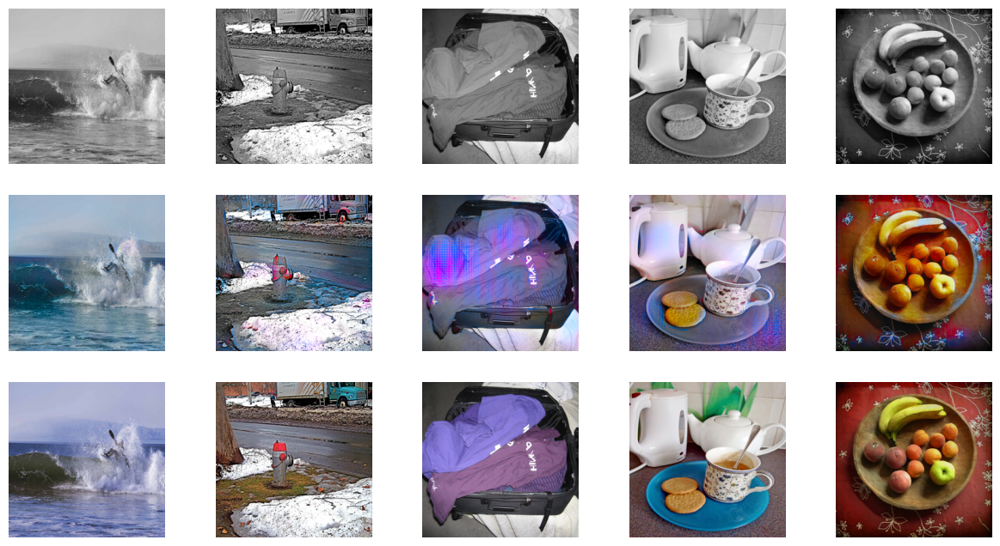

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 8/10
Iteration 1000/1000
loss_D_fake: 0.57937
loss_D_real: 0.62195
loss_D: 0.60066
loss_G_GAN: 1.04058
loss_G_L1: 7.49630
loss_G: 8.53688


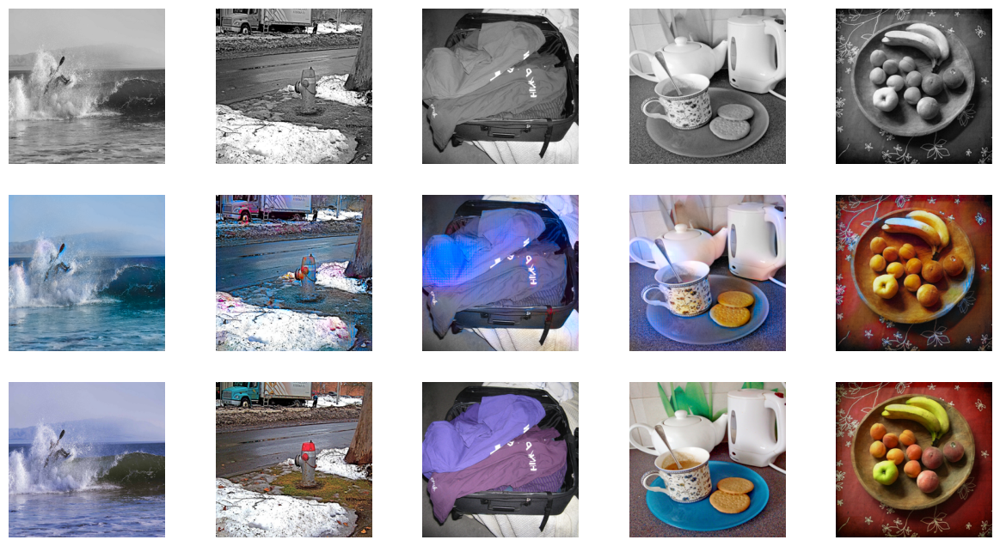

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 9/10
Iteration 1000/1000
loss_D_fake: 0.58093
loss_D_real: 0.61959
loss_D: 0.60026
loss_G_GAN: 1.03943
loss_G_L1: 7.33080
loss_G: 8.37023


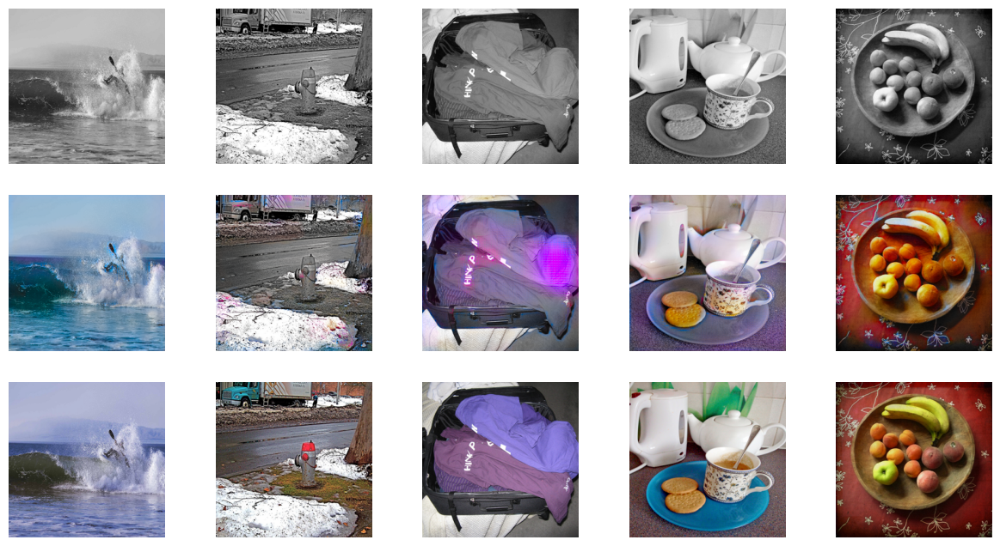

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 10/10
Iteration 1000/1000
loss_D_fake: 0.58037
loss_D_real: 0.61899
loss_D: 0.59968
loss_G_GAN: 1.03565
loss_G_L1: 7.21067
loss_G: 8.24632


/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


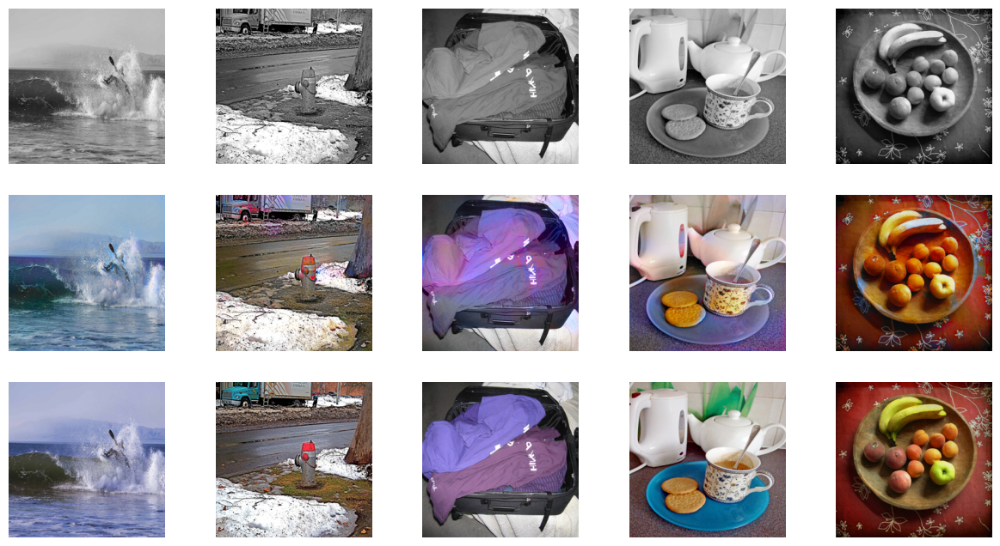

In [28]:
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("res18-unet.pt", map_location=device))
model = MainModel(net_G=net_G)
train_model(model, train_dl, 10)

In [32]:
torch.save(net_G.state_dict(), "res18-unet_G.pt")

/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
/tmp/ipykernel_47/117172840.py:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 5 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


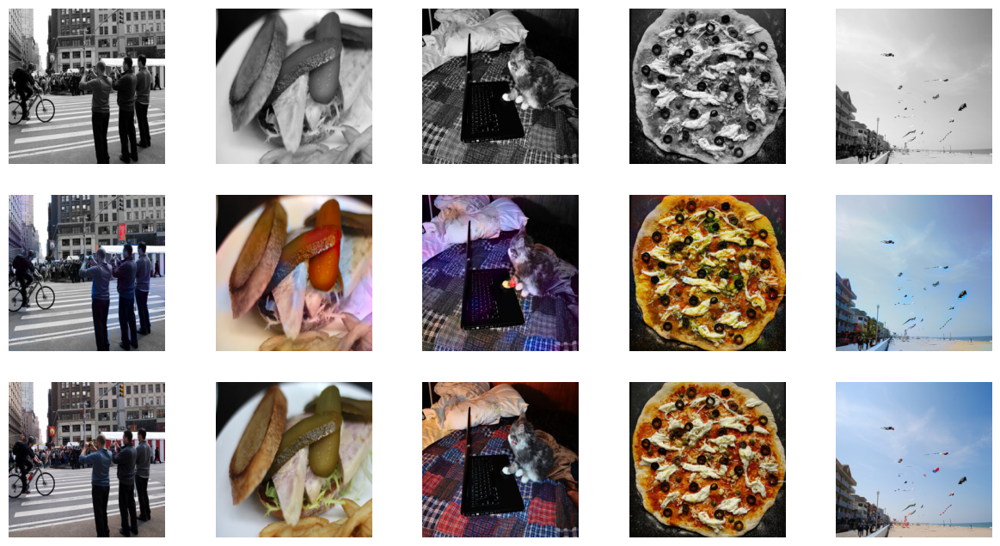

In [33]:
visualize(model, data, save=True)